In [1]:
!pip install librosa

In [2]:
!pip install numpy

In [3]:
!pip install matplotlib

# Helper & Plotting Functions
feel free to skip this section if you are interested in the research results themselves and not in implementing plotting functions and displaying them yourself.

In [7]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wav
import soundfile as sf
from IPython.display import Audio



In [8]:

def plot_audio(audio_data, sample_rate = 1, title='Audio Signal'):
    """
    Plots the audio signal in the time domain.
    Parameters:
        - audio_data (ndarray): Audio signal.
        - sample_rate (int): Sampling rate of the audio signal.
        - title (str): Title of the plot.
    """

    # Create the time axis for plotting
    t = 1/sample_rate * np.arange(0, len(audio_data))
    # Plot the audio signal
    plt.figure()
    plt.plot(t, audio_data)
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.title(title)
    plt.show()

import matplotlib.pyplot as plt

def plot_grid(W, H):
    """
    Plots a grid of subplots where each column of the matrix W is presented alongside the corresponding row of the matrix H.

    Parameters:
        - W (ndarray): Matrix W with shape (n, k), representing the spectral components or basis vectors.
        - H (ndarray): Matrix H with shape (k, m), representing the activation coefficients or temporal patterns.
    """
    num_components = W.shape[1]

    fig, axs = plt.subplots(num_components, 2, figsize=(6, 1.5*num_components))


    for i in range(num_components):
        axs[i, 0].plot(W[:, i])
        axs[i, 0].set_title(f'W_{i+1}')
        axs[i, 1].plot(H[i, :])
        axs[i, 1].set_title(f'H_{i+1}')

    plt.tight_layout()
    plt.show()
import ipywidgets as widgets
import IPython.display as ipd
from ipywidgets import Output, GridspecLayout

def plot_signal_with_audio(signal,audio, sample_rate):
    """
    Plots the audio signal in the time domain alongside an audio widget.

    Parameters:
        - signal (ndarray): Audio signal.
        - sample_rate (int): Sampling rate of the audio signal.
    """
    grid = GridspecLayout(1, 2, align_items='center')
    out = Output()
    with out:
        fig, ax = plt.subplots(figsize=(8, 1))
        ax.plot(audio)
        ax.set_title("sdf")
        plt.close(fig)
        ipd.display(ax.figure)
    grid[0, 0] = out
    out = Output()
    with out:
        ipd.display(ipd.Audio(data=audio, rate=sample_rate))
    grid[0, 1] = out
    ipd.display(grid)


def plot_grid_with_audio(W, H, audio_files):
    """
    Plots a grid of subplots where each column of the matrix W is presented alongside the corresponding row of the matrix H.

    Parameters:
        - W (ndarray): Matrix W with shape (n, k), representing the spectral components or basis vectors.
        - H (ndarray): Matrix H with shape (k, m), representing the activation coefficients or temporal patterns.
    """
    num_components = W.shape[1]

    fig, axs = plt.subplots(num_components, 3, figsize=(10, 3*num_components))

    for i in range(num_components):
        axs[i, 0].plot(W[:, i])
        axs[i, 0].set_title(f'W{i+1}')
        axs[i, 1].plot(H[i, :])
        axs[i, 1].set_title(f'H{i+1}')
        audio_widget = widgets.Audio(auto_play=False, data=audio_files[i], layout=widgets.Layout(width='100%'))
        out  = display(audio_widget)
        player = widgets.HBox(out)
        axs[i, 2].set_title(f'Audiowidget{i+1}')
        display(player)





# Input - audio sample


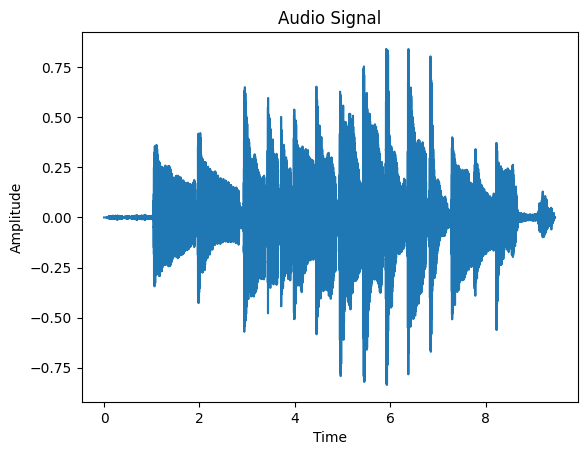

In [10]:
import soundfile as sf
import matplotlib.pyplot as plt

# Read the audio file
audio_data, sample_rate = sf.read('ein.wav')

plot_audio(audio_data, sample_rate, title='Audio Signal')


# STFT -short time fourier transform

The Short-Time Fourier Transform (STFT) is a technique used to analyze the frequency content of a signal over short, overlapping time windows. It provides a way to represent a signal in the time-frequency domain.

The STFT of a signal $x(t)$ is calculated by dividing the signal into small segments or frames of length $N$ and applying the Fourier Transform to each frame. The STFT is defined as:

$X(k, ω) = Σ_{n=0}^{N-1} x(n) w(n) e^{-jωn}$

where:

* $X(k, ω)$     represents the STFT coefficients at frequency $ω$ and time frame $k$.
* $x(n)$        is the signal in the time domain.
* $w(n)$        is the window function applied to each frame.
* $N$           is the length of each frame.
* $ω$           is the angular frequency.

The window function w(n) is usually chosen to reduce spectral leakage and control the trade-off between time and frequency resolution. Common window functions include the Hamming, Hanning, and Gaussian windows.



In [11]:
def plot_spectogram(stft,title = None):
    # Display the spectrogram
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(stft, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.show()

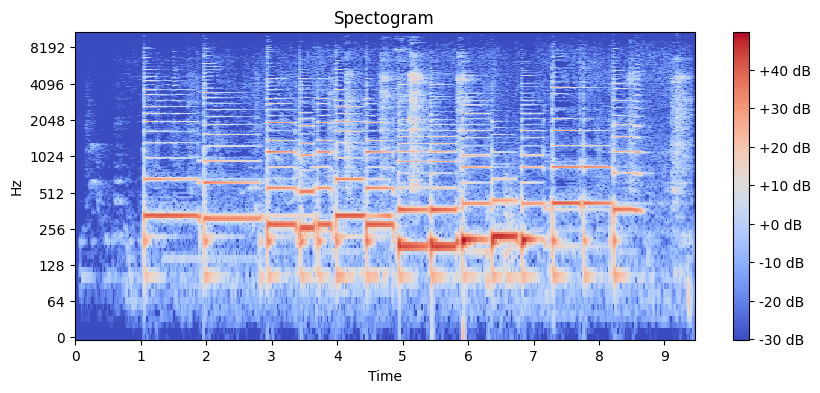

In [12]:

# Load the audio sample
audio_path = "ein.wav"
audio, sr = librosa.load(audio_path)

# Compute STFT
stft = librosa.stft(audio)

# Convert amplitude spectrogram to dB scale
stft_db = librosa.amplitude_to_db(np.abs(stft))

plot_spectogram(stft_db, title='Spectogram')

# Itakura Saito Divergence
The Itakura-Saito divergence is a measure of dissimilarity between two non-negative matrices.
 We will use IS divergence for our non-negative matrix factorization (NMF).
 It is based on the principle that non-negative signals or spectra are more accurately modeled by non-negative combinations of basis elements.

The formula for Itakura-Saito divergence between two matrices P and Q can be expressed as:

$D_{IS}(P, Q) = \sum_{i=1}^{m}\sum_{j=1}^{n} ((P_{ij}/Q_{ij}) - log(P_{ij}/Q_{ij}) - 1)$

where:
* $m$ is the number of rows in the matrices.
* $n$ is the number of columns in the matrices.

The Itakura-Saito divergence is derived from the Kullback-Leibler divergence, a measure of dissimilarity between probability distributions. It provides a way to quantify the resemblance between the original matrix $P$ and the reconstructed matrix $Q$.


In [13]:
V = np.square(abs(stft))

def itakura_saito_divergence(X,Y):
    # element-wise division and logarithm
    ratio = X/Y
    lg = np.log2(ratio)
    # Itakura-Saito distance
    d = ratio - lg -1
    # sum over all entries
    return np.sum(d)
    





# Itakura Saito NMF Algorithm
The goal of NMF is to factorize a non-negative input matrix $X$ into two non-negative matrices $W$ and $H$, such that $X \approx WH$. The NMF algorithm goes as follows:

## initiate $H$ and $W$
* we start with two non-negative matreces assigned with randomaly assigned values

## Until convergance:

### Update $W$


* The update equation is derived based on the Itakura-Saito divergence objective function:
 * $W_{ij} \leftarrow W_{ij} * \frac{\sum_{k} (\frac{X_{ik}}{WH_{ik}})H_{kj}}{\sum_{k} (\frac{1}{W_{ik}})H_{kj}}$

### update $H$:

* in a symmetric manner, we update $H$:
 * $H_{kj} \leftarrow H_{kj} * \frac{\sum_{i} (\frac{X_{ik}}{WH_{ik}})W_{ij}}{\sum_{i} (\frac{1}{H_{ik}})W_{ij}}$

### Output: $W ; H$

In [14]:
import numpy as np

def IS_NMF(X, K, max_iter=200, tol=1e-5, loss = itakura_saito_divergence):
    F, N = X.shape # F: number of frequencies,  N: number of samples

    # Initialize random non-negative matrices W and H
    W = np.random.rand(F, K)
    H = np.random.rand(K, N)

    errs = []
    for i in range(max_iter):

        # Update matrix H
        WH = np.dot(W, H)                         # X/WH
        numerator = W.T @ np.divide(X, np.power(WH, 2))  # W^t * (X/WH^2)
        denominator = W.T @ np.divide(np.ones(X.shape), WH)
        H *= numerator / denominator

        # Update matrix W
        WH = np.dot(W, H)                         # X/WH
        numerator = np.divide(X, np.power(WH, 2)) @ H.T  #  (X/WH^2) *H^t
        denominator = np.divide(np.ones(X.shape), WH) @ H.T
        W *= numerator / denominator

        # Compute current approximation error using Itakura-Saito divergence
        err = loss(X, np.dot(W, H))
        errs.append(err)
        # Check for convergence
        if err < tol:
            break

    return W, H, errs


In [15]:
W , H, errs = IS_NMF(V,10)


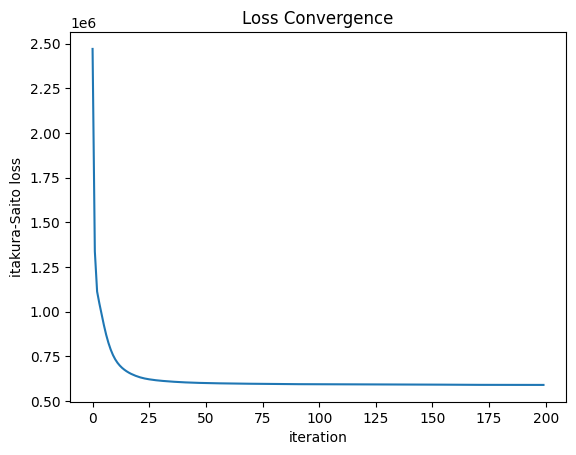

In [16]:
def plot_convergence(errs, loss ='itakura-Saito loss'):
    plt.figure()
    iter = range(len(errs))
    plt.plot(iter,errs)
    plt.xlabel('iteration')
    plt.ylabel(loss)
    plt.title('Loss Convergence')
    plt.show()

plot_convergence(errs)

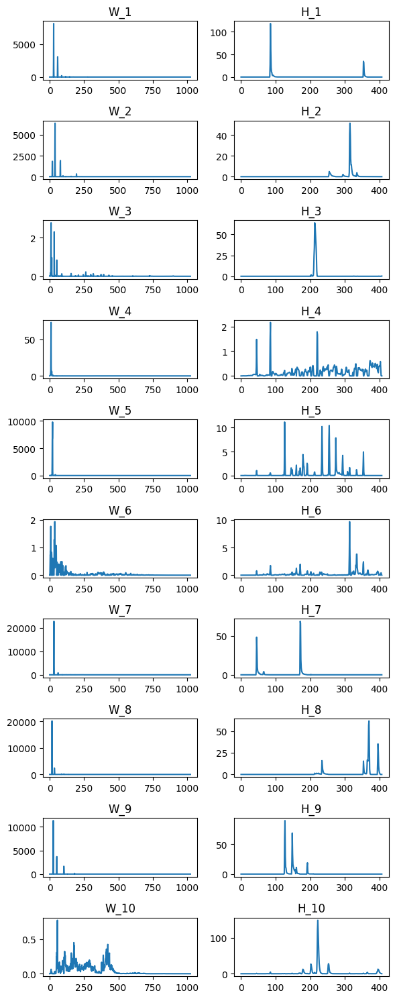

In [17]:
plot_grid(W, H)

# Wiener Filter

The Wiener filter is a widely used signal processing technique that aims to minimize the mean square error between an estimated signal and a desired signal. It is commonly employed for noise reduction or signal enhancement purposes.

The Wiener filter operates in the frequency domain and is based on the assumption that the desired signal and the noise are uncorrelated. The filter takes the form of a frequency response function that can be applied to the noisy signal to obtain an estimate of the desired signal.

The frequency response function of the Wiener filter is given by:

$H(\omega) = \frac{S_{XX}(\omega)}{S_{XX}(\omega) + S_{NN}(\omega) / S_{DD}(\omega)}$

where:

* $H(\omega)$ represents the frequency response of the Wiener filter at angular frequency $\omega$.
* $S_{XX}(\omega)$ is the power spectral density (PSD) of the noisy signal.
* $S_{NN}(\omega)$ is the PSD of the noise.
* $S_{DD}(\omega)$ is the PSD of the desired signal.
* The Wiener filter adaptively adjusts its frequency response based on the characteristics of the signals involved. It attenuates the noise component by exploiting the ratio between the power spectral densities of the desired signal and the noise at each frequency.

By applying the Wiener filter to the noisy signal in the frequency domain and performing an inverse Fourier transform, an estimate of the desired signal can be obtained.

In [18]:
def wiener_filter(W, H, X):
    F,K = W.shape
    N = H.shape[1]

    C = np.zeros((F,N,K),dtype = 'complex_')


    for f in range(F):
        for n in range(N):
            denominator = 0
            for k in range(K):
                nominator = W[f,k] * H[k,n]
                denominator += nominator
                C[f,n,k]  = nominator * X[f,n]
            C[f,n] /= denominator
    return C

In [19]:
from scipy import signal

# Apply the Wiener filter using scipy's wiener function
filtered_output = wiener_filter(W,H,stft)


# Save and hear the result
here we will save the result as a wav file and play it, notice the seperation of the different notes and frequency profiles

In [21]:
def reconstruct(filtered_output):
    output =[]
    for k in range(filtered_output.shape[2]):
         output.append( librosa.istft(filtered_output[:,:,k]))
    summed = np.sum(np.array(output), axis=0)

    # Convert the signal to a .wav file
    output_file = f'reconstructed.wav'
    sf.write(output_file, summed, int(0.8 * sample_rate))

    print("reconstructed audio")
    audio_widget= Audio(output_file,element_id=f'reconstructed')
    display(audio_widget)
    return output

output = reconstruct(filtered_output)

reconstructed audio


In [22]:
def separate_channels(output):
    audio_files = []
    for i, out in enumerate(output):
        # Convert the signal to a .wav file
        output_file = f'reconstructed{i}.wav'
        sf.write(output_file, out, sample_rate)
        audio_files.append(output_file)
        print("component",i)
        audio_widget= Audio(output_file,element_id=f'reconstructed{i}')
        display(audio_widget)

separate_channels(output)

component 0


component 1


component 2


component 3


component 4


component 5


component 6


component 7


component 8


component 9


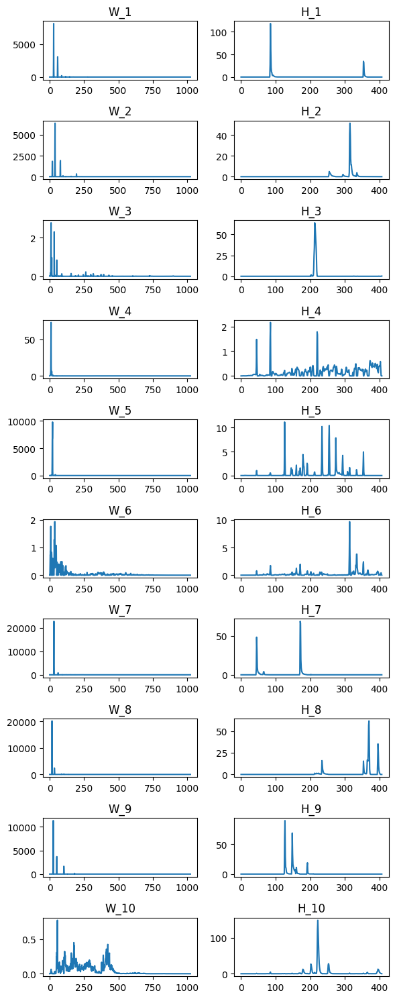

In [23]:

#Audio(output_file,element_id='reconstructed audio')
plot_grid(W, H)


# Experiment on Other Audio Samples

let's wrap up the whole experiment and repeat it for all kinds of other data

In [24]:
def NMF_show_results(X, K, loss = itakura_saito_divergence):
    plot_audio(X)

    stft = librosa.stft(X)
    V = np.square(abs(stft))

    W , H, errs = IS_NMF(V,K,loss = loss, max_iter = 40)

    plot_convergence(errs)

    filtered_output = wiener_filter(W,H,stft)

    output = reconstruct(filtered_output)

    plot_grid(W, H)

    separate_channels(output)


original audio


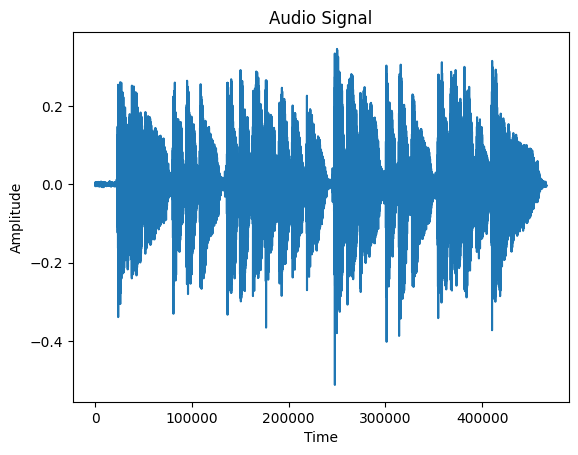

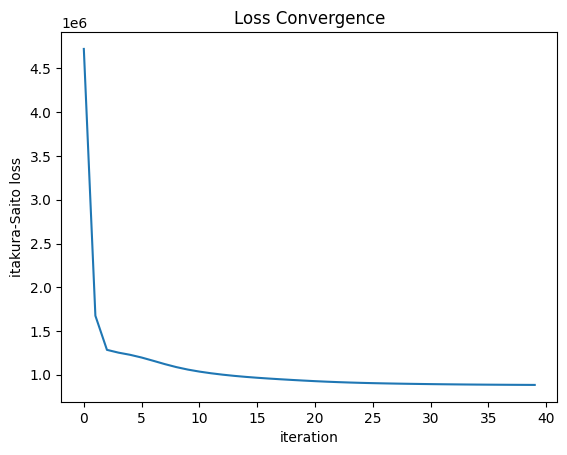

reconstructed audio


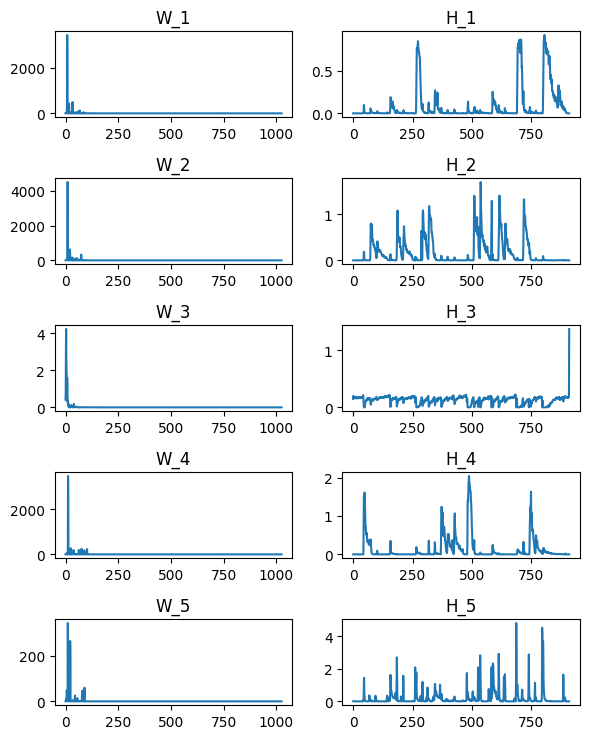

component 0


component 1


component 2


component 3


component 4


In [44]:

print('original audio')
audio_widget= Audio('yhonatan.wav',element_id=f'reconstructe')
# Read the audio file

audio_data, sample_rate = sf.read('yhonatan.wav')

NMF_show_results(audio_data, 5)

display(audio_widget)


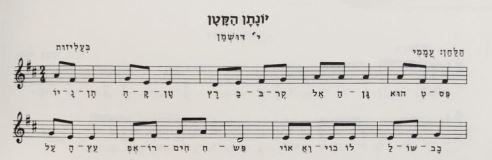


# Lets try the same sample for another value of k

would the algorithm be able to effectively seperate and reconstruct?

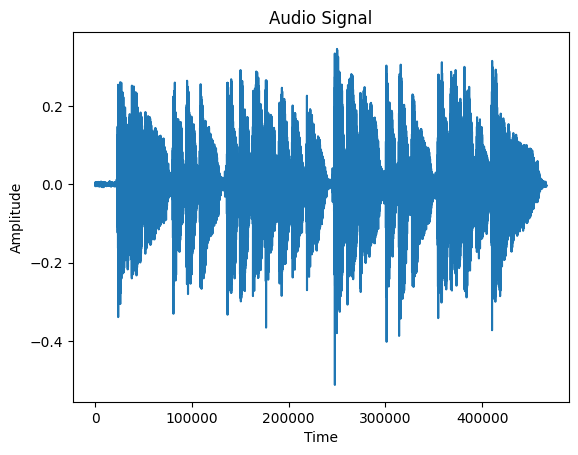

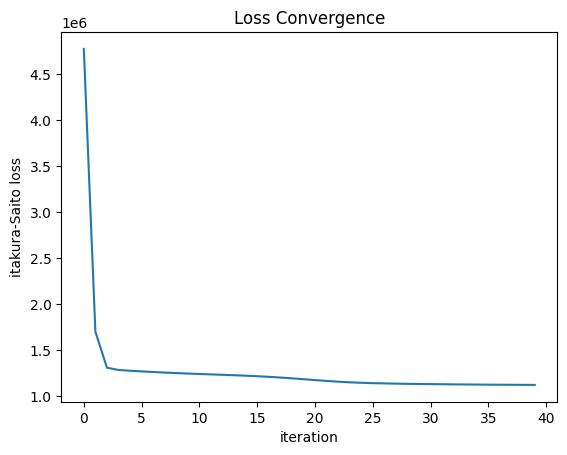

reconstructed audio


In [ ]:
NMF_show_results(audio_data,2)


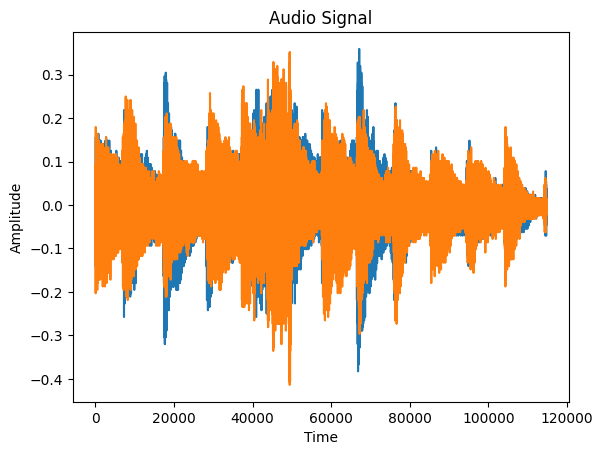

ValueError: too many values to unpack (expected 2)

In [42]:
audio_widget= Audio('Chopin2.wav',element_id=f'audio')
display(audio_widget)

audio_data, sample_rate = sf.read('Chopin2.wav')

NMF_show_results(audio_data, 10)